<a href="https://colab.research.google.com/github/wayne-wu/nerf-pytorch/blob/main/nerf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CIS680 Final Project: Neural Radiance Field
Wayne Wu, Yu-Chia Shen

In [ ]:
IS_COLAB = True

try:
    from google.colab import drive
except:
    IS_COLAB = False

if IS_COLAB:
  !pip install pytorch_lightning &> /dev/null

import os
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
import pytorch_lightning as pl
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
import torch.nn.functional as F

%load_ext tensorboard

# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
seed = 17
torch.manual_seed(seed);

def memprint(text):
  print("{0}: {1}".format(text, torch.cuda.memory_allocated()/1e9))

In [ ]:
if IS_COLAB:
    drive.mount('/content/gdrive')

    # data is symlink to the actual data stored here: 
    # https://drive.google.com/drive/folders/128yBriW1IG_3NJ5Rp7APSTZsJqdJdfc1 
    gdrive_path =  '/content/gdrive/MyDrive/CIS680/final'
    data_path = os.path.join(gdrive_path, 'data')
else:
    gdrive_path = '.'
    data_path = '.'

    if not os.path.isfile('nerf_example_data.zip'):
        !wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/nerf_example_data.zip
        !unzip nerf_example_data.zip    

Mounted at /content/gdrive


In [ ]:
if not os.path.isfile('tiny_nerf_data.npz'):
    !wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz

data = np.load('tiny_nerf_data.npz')
dataset = None

In [ ]:
from scipy.spatial.transform import Rotation as R

class NerfSimpleDataset(torch.utils.data.Dataset):
  
  def __init__(self, data):
    self.images = data['images']
    self.poses = data['poses']
    self.focal = data['focal']

  def __getitem__(self, index):
    img = torch.tensor(self.images[index])
    pose = torch.tensor(self.poses[index])
    return img, pose, self.focal

  def mat_to_euler(self, pose):
    r = R.from_matrix(pose)
    d = r.as_euler(degrees=True)
    return d

  def __len__(self):
    return self.images.shape[0]

simpleDataset = NerfSimpleDataset(data)
for i in range(3):
  idx = np.random.randint(0, len(simpleDataset))
  img, pose, f = simpleDataset[idx]
  print(img.shape)
  plt.imshow(img)
  plt.title("Focal: {0}".format(f))
  plt.show()
  print(pose)

NameError: ignored

In [ ]:
from torch._C import NoneType
import json
from PIL import Image

class NerfSyntheticDataset(torch.utils.data.Dataset):

  def __init__(self, json_file, scale=0.5, length=-1, pre_load=False):
    self.base_path = os.path.dirname(json_file)
    f = open(json_file)
    self.data = json.load(f)
    f.close()

    self.pre_load = pre_load

    self.scale = scale

    self.length = length
    self.imgs = []
    self.poses = []
    self.focal = None

    self.T = transforms.Compose([
      transforms.ToTensor()])

    if pre_load:
      for d in self.data['frames']:
        self.imgs.append(self.load_image(d['file_path']))
        self.poses.append(torch.tensor(d['transform_matrix'], dtype=torch.float))
        fov_x = torch.tensor([self.data['camera_angle_x']])
        self.focal = 0.5 * self.imgs[0].shape[0] / torch.tan(.5 * fov_x)

  def load_image(self, path):
    img = Image.open(
        os.path.join(self.base_path, "{0}.png".format(path)))
    w, h = img.size
    img = torch.permute(self.T(img.resize((int(w*self.scale),int(h*self.scale)))), (1,2,0))[:,:,:3]
    return img

  def __getitem__(self, index):
    if self.pre_load:
      return self.imgs[index], self.poses[index], self.focal
    else:
      d = self.data['frames'][index]
      img = self.load_image(d['file_path'])
      pose = torch.tensor(d['transform_matrix'], dtype=torch.float)
      fov_x =  torch.tensor([self.data['camera_angle_x']])
      f = .5 * img.shape[0] / torch.tan(.5 * fov_x)

    return img, pose, f

  def __len__(self):
    return len(self.data['frames']) if self.length==-1 else self.length

torch.Size([400, 400, 3])


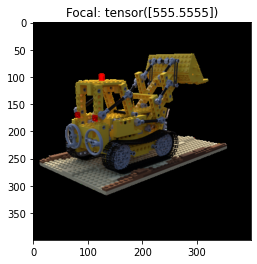

tensor([[-0.7199,  0.1476, -0.6782, -2.7338],
        [-0.6940, -0.1531,  0.7035,  2.8358],
        [ 0.0000,  0.9771,  0.2126,  0.8570],
        [ 0.0000,  0.0000,  0.0000,  1.0000]])
torch.Size([400, 400, 3])


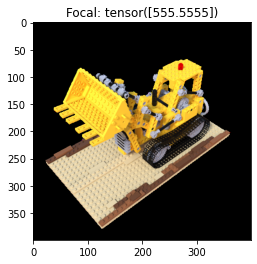

tensor([[ 6.5707e-01, -5.1133e-01,  5.5389e-01,  2.2328e+00],
        [ 7.5383e-01,  4.4570e-01, -4.8280e-01, -1.9462e+00],
        [-1.4901e-08,  7.3477e-01,  6.7832e-01,  2.7344e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])
torch.Size([400, 400, 3])


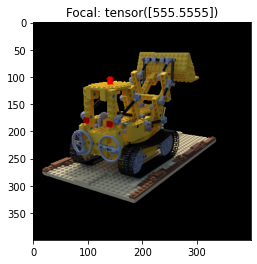

tensor([[-8.4718e-01,  1.4041e-01, -5.1242e-01, -2.0656e+00],
        [-5.3131e-01, -2.2388e-01,  8.1706e-01,  3.2937e+00],
        [ 7.4506e-09,  9.6445e-01,  2.6426e-01,  1.0653e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e+00]])


In [ ]:
train_json = os.path.join(
    data_path, 'nerf_synthetic/lego/transforms_train.json')
trainDataset = NerfSyntheticDataset(train_json)
val_json = os.path.join(
    data_path, 'nerf_synthetic/lego/transforms_val.json')
valDataset = NerfSyntheticDataset(val_json, length=20)
test_json = os.path.join(
    data_path, 'nerf_synthetic/lego/transforms_test.json')
testDataset = NerfSyntheticDataset(test_json)

# Prepare Data
batch_size = 1
cpus = os.cpu_count() if IS_COLAB else 0

train_loader = torch.utils.data.DataLoader(
    trainDataset, 
    batch_size=batch_size, 
    shuffle=True, num_workers=cpus,
    pin_memory=use_cuda)
val_loader = torch.utils.data.DataLoader(
    valDataset, 
    batch_size=batch_size, 
    shuffle=False, num_workers=cpus,
    pin_memory=use_cuda)
test_loader = torch.utils.data.DataLoader(
    testDataset,
    batch_size=batch_size, 
    shuffle=False , num_workers=cpus,
    pin_memory=use_cuda)

for i in range(3):
  idx = np.random.randint(0, len(trainDataset))
  img, pose, f = trainDataset[idx]
  print(img.shape)
  plt.imshow(img)
  plt.title("Focal: {0}".format(f))
  plt.show()
  print(pose)

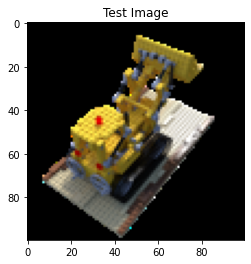

In [ ]:
testIdx = 10

img, pose, f = testDataset[testIdx]
plt.imshow(img)
plt.title("Test Image")
plt.show()

In [ ]:
from torch.nn.functional import normalize
from torch.optim.lr_scheduler import ExponentialLR
from torchmetrics import PeakSignalNoiseRatio

class Nerf_Model(nn.Module):
  def __init__(self, in_channel=60, in_channel_view=24, W=256, view_dep=True):
    super().__init__()
    self.W = W
    self.view_dep = view_dep
    self.upper = nn.Sequential(
        nn.Linear(in_channel, W),
        nn.ReLU(),
        nn.Linear(W, W),
        nn.ReLU(),
        nn.Linear(W, W),
        nn.ReLU(),
        nn.Linear(W, W),
        nn.ReLU(),
        nn.Linear(W, W),
        nn.ReLU(),
    )

    self.lower = nn.Sequential(
        nn.Linear(W+in_channel, W),
        nn.ReLU(),
        nn.Linear(W, W),
        nn.ReLU(),
        nn.Linear(W, W),
        nn.ReLU()
    )

    self.density_out = nn.Sequential(
        nn.Linear(W, 1), # density layer
        # nn.ReLU(),  # moved relu to after for regularization
    )

    self.feat_layer = nn.Linear(W, W)

    if self.view_dep:
      self.out_layer = nn.Sequential(
          nn.Linear(W+in_channel_view, W//2), # view layer
          nn.ReLU(),
          nn.Linear(W//2, 3), # rgb layer
          # nn.Sigmoid() 
      )
    else:
      self.out_layer = nn.Sequential(
          nn.Linear(W, 4))


  def forward(self, x, d):
    out = x
    out = self.upper(out)

    out = torch.cat([out, x], dim=-1)
    out = self.lower(out)

    if self.view_dep:
      density = self.density_out(out)
      out = self.feat_layer(out)
      out = torch.cat([out, d], dim=-1)
      out = self.out_layer(out)
      out = torch.cat([out, density], dim=-1)
    else:
      out = self.out_layer(out)

    return out

class NERF(pl.LightningModule):
  
  def __init__(self, 
               hierarchical_sampling=False, 
               rays_per_chunk=1024*4,
               view_dep=True):
    super().__init__()

    self.net_c = Nerf_Model(view_dep=view_dep)

    if hierarchical_sampling:
      self.net_f = Nerf_Model(view_dep=view_dep)

    self.print_valid = True

    self.view_dep = view_dep
    self.hierarchical_sampling = hierarchical_sampling
    self.automatic_optimization = False

    self.chunk = rays_per_chunk

    self.mse = torch.nn.MSELoss()
    self.psnr_fn = PeakSignalNoiseRatio(data_range=1.0)

    self.psnrs = []
    
    self.lr_decay = True

  def forward(self, rays_o, rays_d, stratified=False):
    return self.render(rays_o, rays_d, stratified=stratified)

  """
  x: shape {B x H x W x N x 3}: [x, y, z] coordinate
  d: shape {B x H x W x N x 3}: [dx, dy, dz] viewing direction

  output:
  color: shape {(B*H*W*N) x 3}
  density: shape {(B*H*W*N) x 1}
  """
  def nerf(self, x, d, model):
    # Do not normalize coordinates here!!
    
    x = self.pos_encode(x, L=10) # 60
    x = x.reshape(-1, x.shape[-1]) # H*W*N x 60

    if self.view_dep:
      d = self.pos_encode(d, L=4) # 24
      d = d.reshape(-1, d.shape[-1]) # H*W*N x 24

    return model(x, d)

  def generate_rays(self, imgs, poses, fs):
    """
    imgs: {B, H, W, 3}
    poses: {B, 4, 4}
    fs: {B, 1}

    More info here: https://www.scratchapixel.com/lessons/3d-basic-rendering/ray-tracing-generating-camera-rays/generating-camera-rays
    """
    # NOTE: pose is the cameraToWorld (c2w) matrix
    B, W, H, _ = imgs.shape

    x, y = torch.meshgrid(torch.arange(W), 
                          torch.arange(H), 
                          indexing='xy')
    x = x.type_as(imgs)
    y = y.type_as(imgs)
    x = (x - 0.5*W)/fs[0]
    y = (0.5*H - y)/fs[0]

    # camera coordinate of pixel
    uv1 = torch.stack((x, y, -torch.ones_like(x)), dim=-1) 

    rays_d = torch.zeros_like(imgs)
    rays_o = torch.zeros_like(imgs)

    for i in range(B):
      pose = poses[i]
      R = pose[:3, :3]
      T = pose[:3,3]

      rays_d[i] = torch.sum(uv1[..., None, :] * R, -1)
      # rays_d[i] = normalize(rays_d[i], dim=-1)
      rays_o[i] = torch.broadcast_to(T, rays_d[i].shape)

    return rays_o, rays_d

  def compute_loss(self, batch, shuffle=True, backward=True):

    imgs, poses, focals = batch

    # B x H x W x 3
    rays_o, rays_d = self.generate_rays(imgs, poses, focals)

    rays_o = rays_o.reshape(-1, rays_o.shape[-1]) # B*H*W x 3
    rays_d = rays_d.reshape(-1, rays_d.shape[-1])

    imgs = imgs.reshape(-1, imgs.shape[-1]) # B*H*W x 3

    if shuffle:
      shuffle_indices = torch.randperm(rays_o.shape[0])

      rays_o = rays_o[shuffle_indices]
      rays_d = rays_d[shuffle_indices]
      imgs = imgs[shuffle_indices]

    loss_c = loss_f = 0

    # Accumulate graident across mini-batch to avoid OOM
    for i in range(0, imgs.shape[0], self.chunk):

      coarse, fine = self(rays_o[i:i+self.chunk], rays_d[i:i+self.chunk], stratified=True)

      loss = self.mse(coarse[0], imgs[i:i+self.chunk])
      loss_c += float(loss)

      if fine:
        l = self.mse(fine[0], imgs[i:i+self.chunk])
        loss_f += float(l)
        loss += l

      if backward:
        self.manual_backward(loss)

    return loss_c + loss_f, loss_c, loss_f


  def render_samples(self, t, rays_o, rays_d, model, noise_std=1.0):
    isect = rays_o[...,None,:] + t[...,:,None] * rays_d[...,None,:]

    # NOTE: Use expand to not create new memory
    rd = rays_d[...,None,:].expand(isect.size()) # [W, H, n, 3]

    # c = {H*W*n, 3}, d = {H*W*n, 1}
    out = self.nerf(isect, rd, model) 
    out = out.view(list(isect.shape[:-1])+[4])

    # reshape to W, H, N, 3
    c = out[...,:3]
    d = out[...,-1]
    
    if noise_std > 0:
      # apply Gaussian noise
      d += torch.randn(d.shape, device=self.device)*noise_std
    
    c = torch.sigmoid(c)
    d = torch.relu(d)

    # delta
    dt = torch.zeros_like(t)
    dt[...,:-1] = torch.diff(t,1)
    dt[...,-1] = 1e10

    # alpha
    a = 1.0 - torch.exp(-d*dt) # [W, H, N]

    # shift by one for exclusive cumprod
    b = torch.cumprod(1.0-a+1e-10, dim=-1)
    b = torch.roll(b, 1, dims=-1) 
    b[...,0] = 1.0

    # weight
    w = a * b # cum prod of each element

    rgb = torch.sum(w.unsqueeze(-1) * c + 1e-10, -2) # sum across all samples
    depth = torch.sum(w * t, -1)
    acc = torch.sum(w, -1)

    return rgb, depth, acc, w

  # """
  # Volume renderer
  # rays_o: [B, H, W, 3]
  # rays_d: [B, H, W, 3]

  # return: [B, H, W, 3]
  # """
  def render(self, rays_o, rays_d,
             t_n=2.0, t_f=6.0, Nc=64, Nf=128, stratified=False):
    """
    More info here: https://courses.cs.duke.edu/spring03/cps296.8/papers/max95opticalModelsForDirectVolumeRendering.pdf
    """
    samples = self.get_coarse_samples(t_n, t_f, Nc, stratified=stratified)
    coarse = self.render_samples(samples, rays_o, rays_d, self.net_c)

    fine = None
    if self.hierarchical_sampling:
      samples = self.get_fine_samples(samples.unsqueeze(0).expand(list(rays_o.shape[:-1]) + [samples.shape[0]]), coarse[3], Nf)
      fine = self.render_samples(samples, rays_o, rays_d, self.net_f)

    # memprint("render end")
    return coarse, fine

  def get_coarse_samples(self, t_n, t_f, N, stratified=False):
    t = torch.linspace(t_n, t_f, N, device=self.device)
    if stratified:
      t += torch.rand(*t.shape, device=self.device)*(t_f-t_n)/N
    return t

  def get_fine_samples(self, coarse_t, coarse_weight, N):
    # TODO: Use inverse transform sampling to get the fine samples

    weights = coarse_weight[..., 1:-1]

    pdf = normalize(weights, p=1.0, dim=-1)

    # cdf shape: [num_rays, num_sample_c-1]
    cdf = torch.cumsum(pdf, dim=-1)
    cdf = torch.concat([torch.zeros_like(cdf[..., :1]), cdf], dim=-1)  

    # Take sample indices from uniform[0, 1]
    u = torch.rand(list(cdf.shape[:-1]) + [N]).to(self.device).contiguous()

    samples_indices = torch.searchsorted(cdf, u, right=True)

    bot_idx = torch.clamp(samples_indices - 1, min=0)
    top_idx = torch.clamp(samples_indices, max=cdf.shape[-1] - 1)
    sample_indices_pair = torch.stack([bot_idx, top_idx], dim=-1)

    samples_shape = list(sample_indices_pair.shape[:-1]) + [cdf.shape[-1]]
    
    # cdf shape: [num_ray, num_sample_f, num_sample_c]
    cdf = cdf.unsqueeze(-2).expand(samples_shape)
    cdf_idx = torch.gather(cdf, dim=-1, index=sample_indices_pair)

    # coarse_t
    t_mid = 0.5 * (coarse_t[..., 1:] + coarse_t[..., :-1])
    sample_pairs = t_mid.unsqueeze(-2).expand(samples_shape)
    sample_pairs = torch.gather(sample_pairs, dim=-1, index=sample_indices_pair)

    cdf_length = (cdf_idx[..., 1] - cdf_idx[..., 0])
    cdf_length = torch.where(cdf_length < 1e-5, 1, cdf_length)
    t = (u - cdf_idx[..., 0]) / cdf_length

    samples = sample_pairs[..., 0] + t * (sample_pairs[..., 1] - sample_pairs[..., 0])

    samples = samples.detach()

    samples_combined, _ = torch.sort(torch.cat([samples, coarse_t], dim=-1), dim=-1)

    return samples_combined

  """
  Positional frequency encoding
  """
  def pos_encode(self, x, L=6):
    output = []
    for i in range(L):
        output.append(torch.sin(x * (2**i)))
        output.append(torch.cos(x * (2**i)))
    return torch.cat(output, -1)

  def training_step(self, batch, batch_idx):
    opt = self.optimizers()

    loss, loss_c, loss_f = self.compute_loss(batch)

    opt.step()
    opt.zero_grad()

    self.log("loss", float(loss), on_step=True, prog_bar=True)
    self.log("loss_c", float(loss_c), on_step=True, prog_bar=True)
    self.log("loss_f", float(loss_f), on_step=True, prog_bar=True)

    if self.lr_decay and self.trainer.is_last_batch:
      sch = self.lr_schedulers()
      sch.step()
      for param_group in self.optimizers().param_groups:
        if param_group['lr'] < 5e-5:
          self.lr_decay = False

  def validation_step(self, batch, batch_idx):
    loss, loss_c, loss_f = self.compute_loss(batch, shuffle=False, backward=False)
    self.log("val loss", loss, on_step=False, on_epoch=True)

    return loss

  def validation_epoch_end(self, outputs):
    self.run_test()

  def run_test(self):
    img, pose, f = testDataset[testIdx]

    img_shape = img.shape

    img = img.unsqueeze(0).to(self.device)
    pose = pose.unsqueeze(0).to(self.device)
    f = f.unsqueeze(0).to(self.device)

    rays_o, rays_d = self.generate_rays(img, pose, f)

    # flatten rays and img
    rays_o = rays_o.reshape(-1, rays_o.shape[-1]) # B*H*W x 3
    rays_d = rays_d.reshape(-1, rays_d.shape[-1])
    img = img.reshape(-1, img.shape[-1]) # B*H*W x 3

    rgb = torch.zeros_like(img)

    for i in range(0, img.shape[0], self.chunk):
      coarse, fine = self(rays_o[i:i+self.chunk], rays_d[i:i+self.chunk])
      rgb[i:i+self.chunk] = fine[0] if fine else coarse[0]

    rgb = rgb.reshape(img_shape)
    img = img.reshape(img_shape)

    psnr = self.psnr_fn(rgb, img).cpu()

    self.log("psnr", psnr)

    self.psnrs.append(psnr)

    plt.figure(figsize=(10,4))
    plt.subplot(121)
    plt.imshow(rgb.cpu())
    plt.title("Iteration: {0}".format(self.global_step))
    plt.subplot(122)
    plt.plot(self.psnrs)
    plt.title("PSNR: {0}".format(psnr))
    plt.savefig(
        os.path.join(gdrive_path, 'fig/{0}.png'.format(self.global_step)))
    plt.show()

  def configure_optimizers(self):
    params = []
    params.append({'params' : self.net_c.parameters()})
    if self.hierarchical_sampling:
      params.append({'params' : self.net_f.parameters()})

    optimizer = torch.optim.Adam(params, lr=5e-4, eps=1e-7)
    scheduler = ExponentialLR(optimizer, gamma=0.98)
    return [optimizer], [scheduler]

In [ ]:
# SET MODEL SETTINGS

model = NERF(
    hierarchical_sampling=False,
    rays_per_chunk=1024*32)

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit native Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Epochs: 1000


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type                 | Params
-------------------------------------------------
0 | net_c   | Nerf_Model           | 593 K 
1 | mse     | MSELoss              | 0     
2 | psnr_fn | PeakSignalNoiseRatio | 0     
-------------------------------------------------
593 K     Trainable params
0         Non-trainable params
593 K     Total params
1.188     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

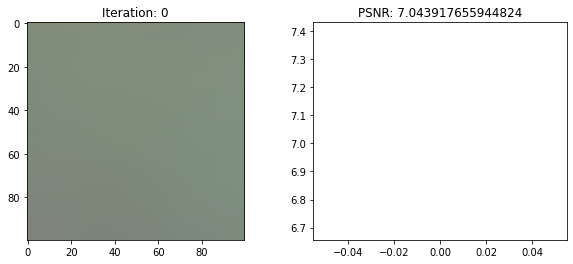

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

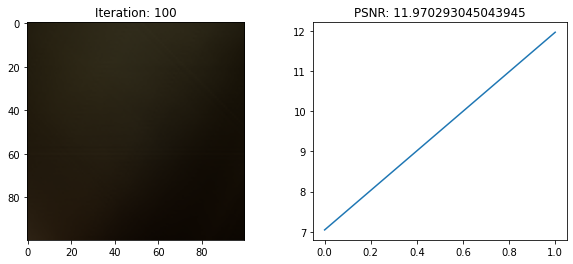

Validation: 0it [00:00, ?it/s]

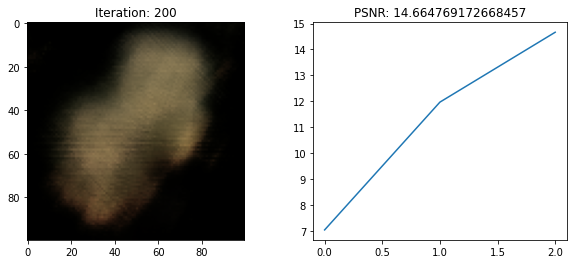

Validation: 0it [00:00, ?it/s]

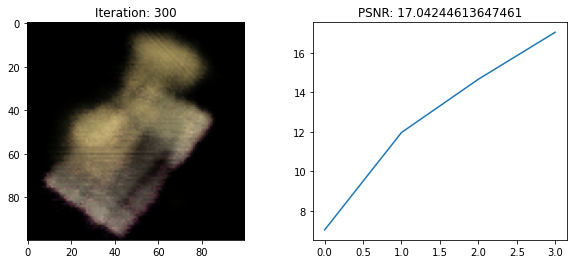

Validation: 0it [00:00, ?it/s]

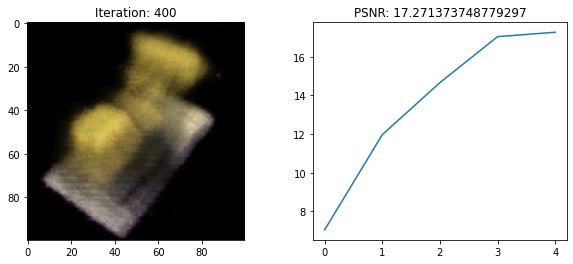

Validation: 0it [00:00, ?it/s]

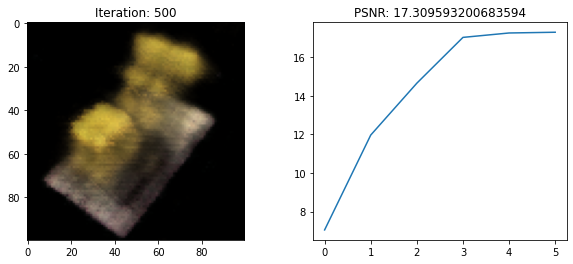

Validation: 0it [00:00, ?it/s]

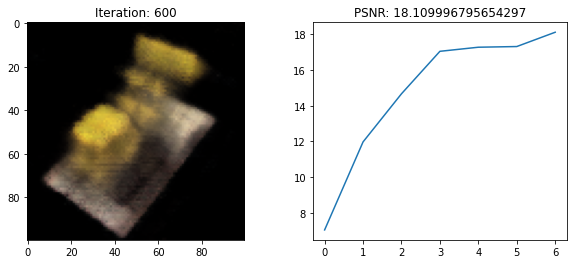

Validation: 0it [00:00, ?it/s]

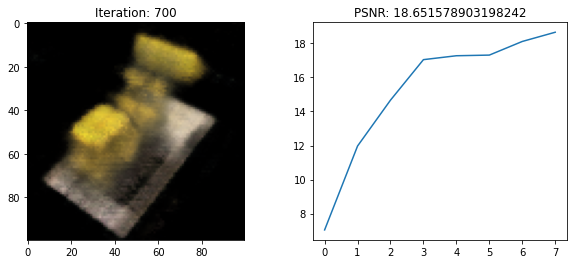

Validation: 0it [00:00, ?it/s]

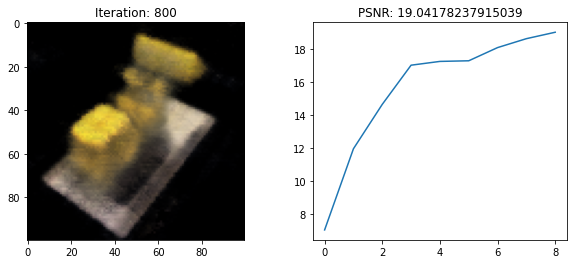

Validation: 0it [00:00, ?it/s]

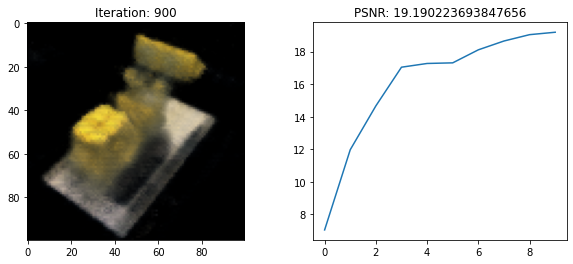

Validation: 0it [00:00, ?it/s]

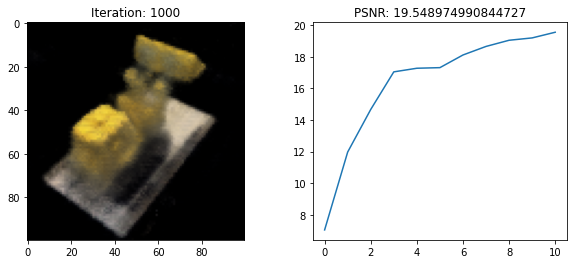

Validation: 0it [00:00, ?it/s]

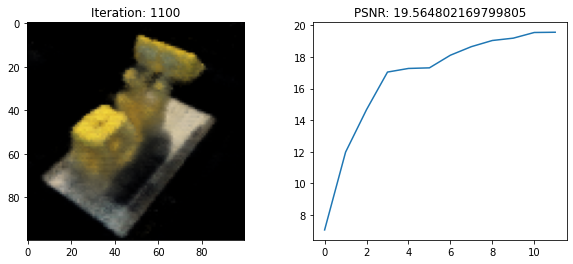

Validation: 0it [00:00, ?it/s]

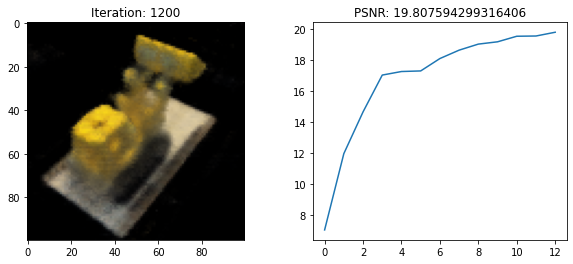

Validation: 0it [00:00, ?it/s]

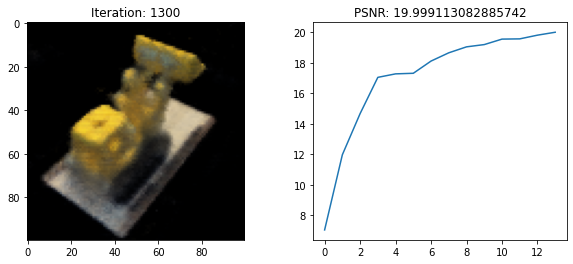

Validation: 0it [00:00, ?it/s]

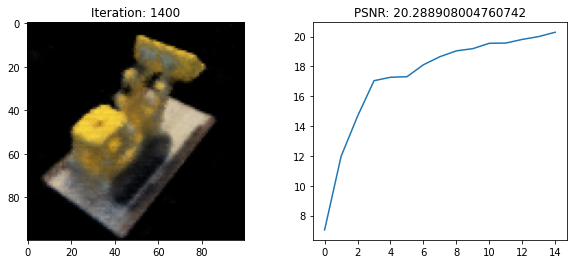

Validation: 0it [00:00, ?it/s]

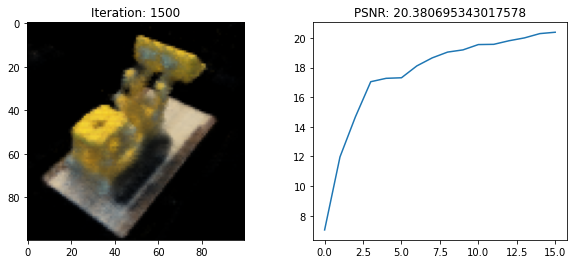

Validation: 0it [00:00, ?it/s]

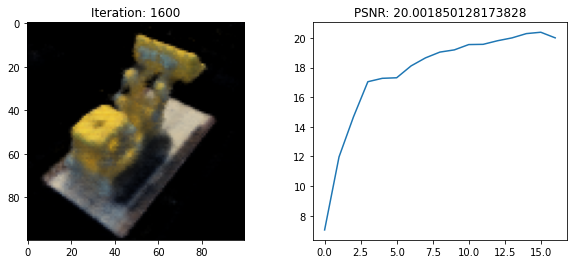

Validation: 0it [00:00, ?it/s]

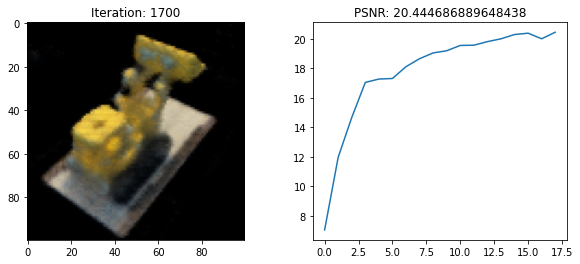

Validation: 0it [00:00, ?it/s]

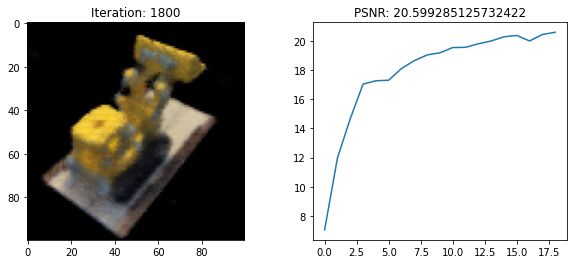

Validation: 0it [00:00, ?it/s]

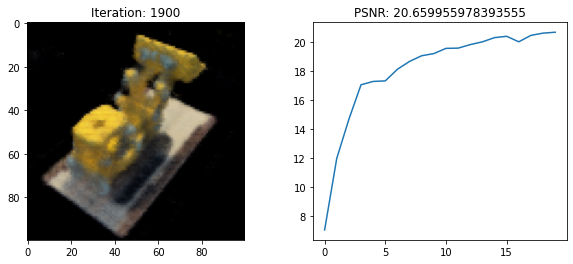

Validation: 0it [00:00, ?it/s]

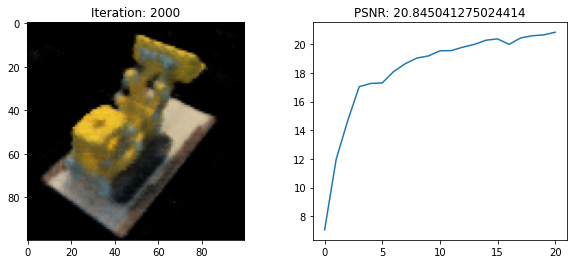

Validation: 0it [00:00, ?it/s]

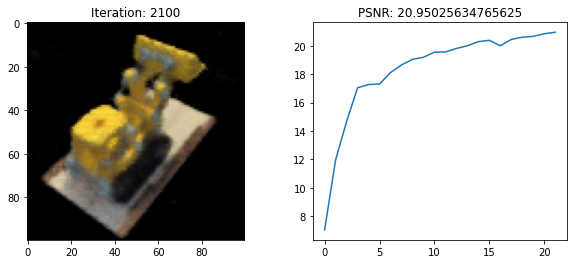

Validation: 0it [00:00, ?it/s]

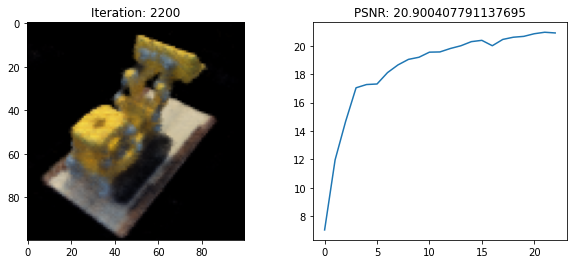

Validation: 0it [00:00, ?it/s]

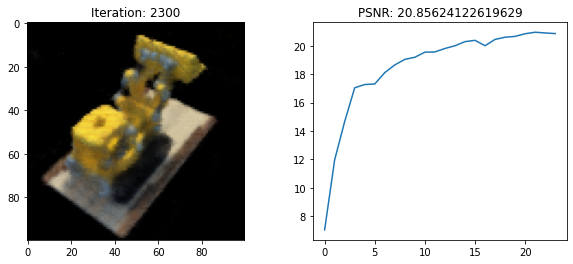

Validation: 0it [00:00, ?it/s]

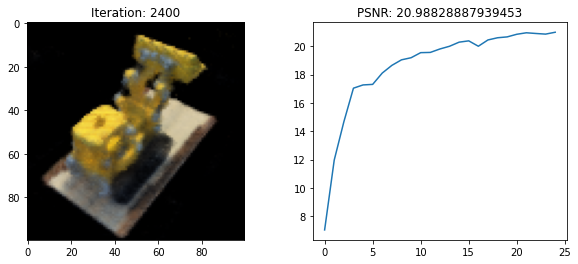

Validation: 0it [00:00, ?it/s]

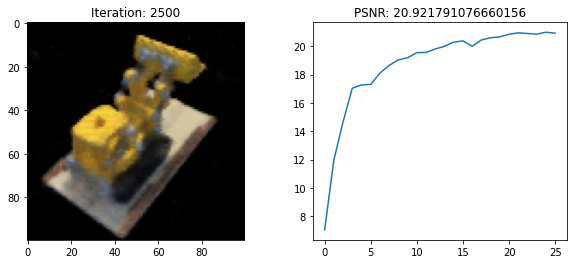

Validation: 0it [00:00, ?it/s]

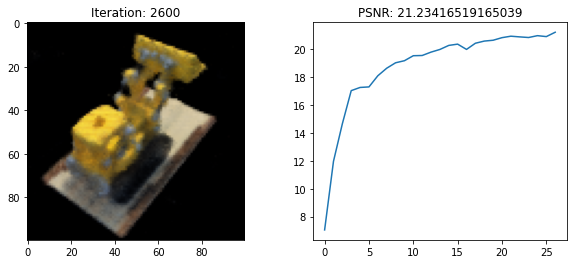

Validation: 0it [00:00, ?it/s]

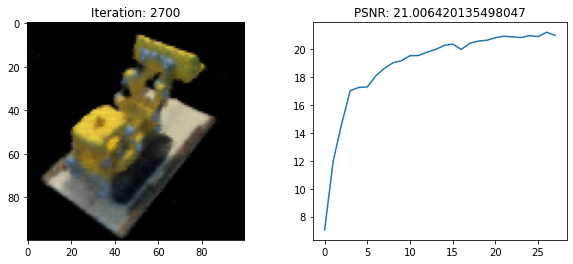

Validation: 0it [00:00, ?it/s]

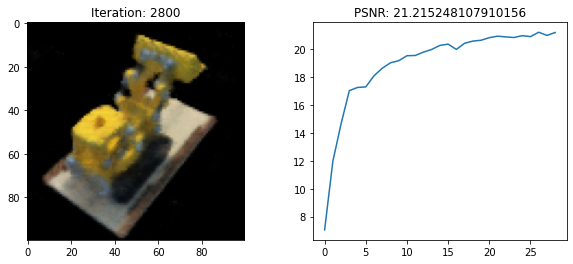

Validation: 0it [00:00, ?it/s]

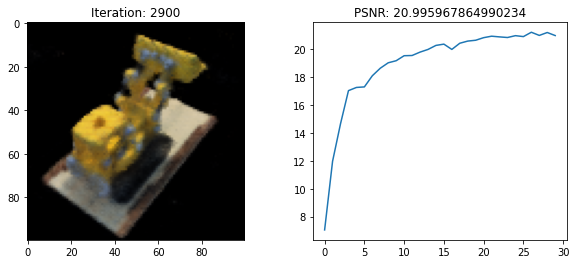

Validation: 0it [00:00, ?it/s]

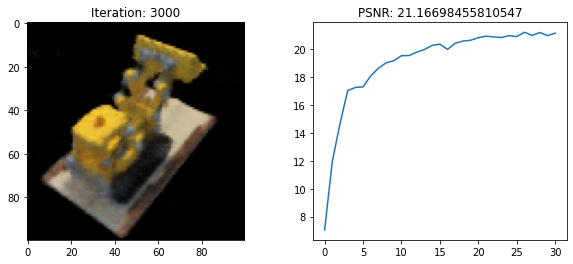

Validation: 0it [00:00, ?it/s]

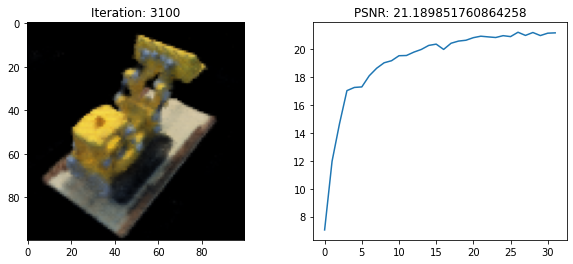

Validation: 0it [00:00, ?it/s]

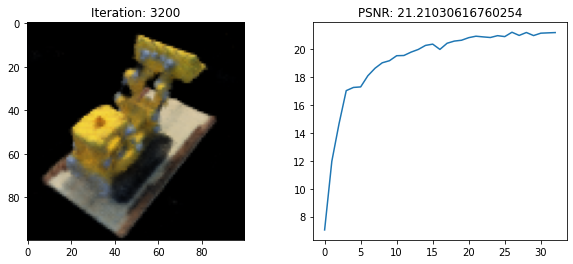

Validation: 0it [00:00, ?it/s]

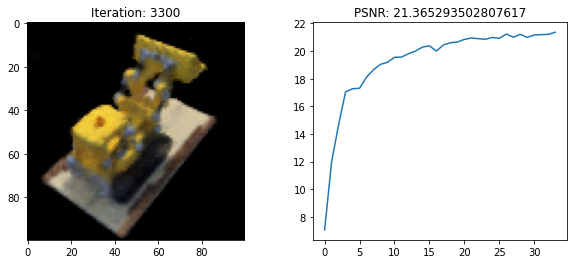

Validation: 0it [00:00, ?it/s]

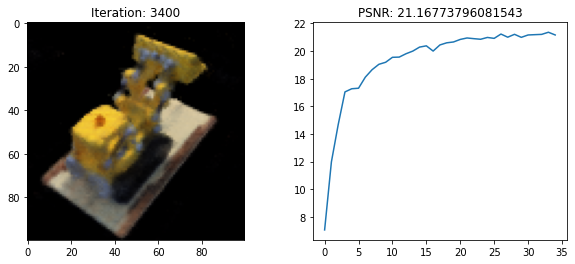

Validation: 0it [00:00, ?it/s]

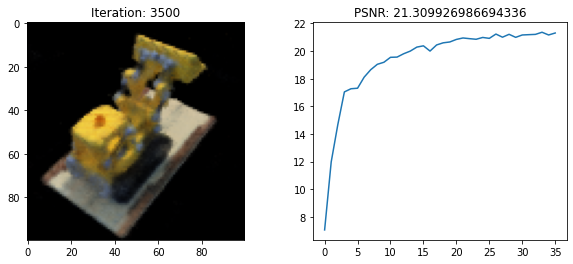

Validation: 0it [00:00, ?it/s]

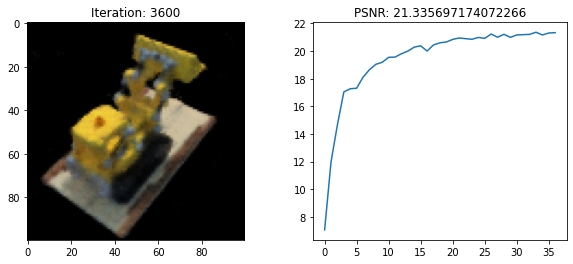

Validation: 0it [00:00, ?it/s]

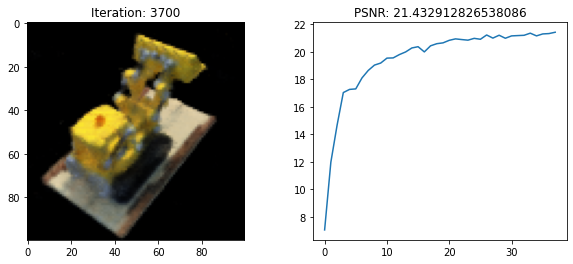

Validation: 0it [00:00, ?it/s]

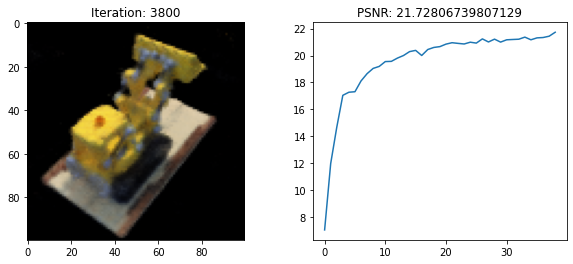

Validation: 0it [00:00, ?it/s]

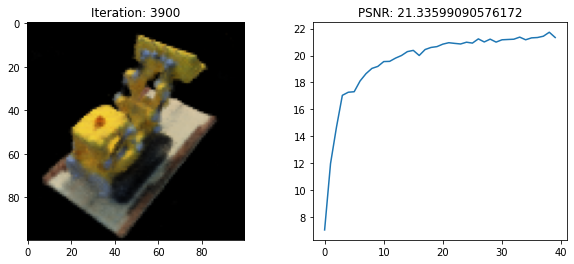

Validation: 0it [00:00, ?it/s]

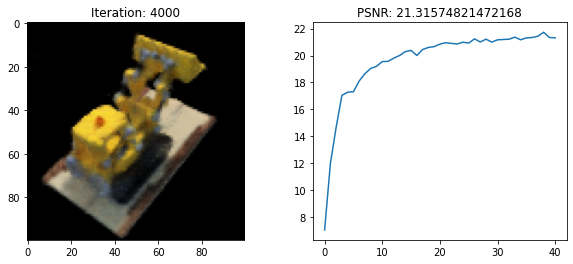

Validation: 0it [00:00, ?it/s]

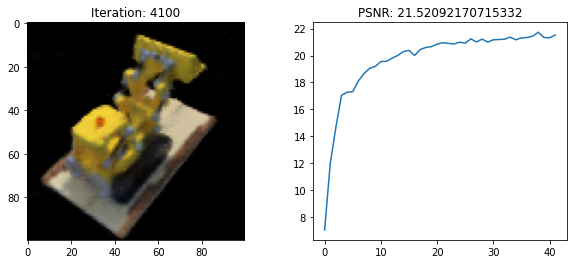

Validation: 0it [00:00, ?it/s]

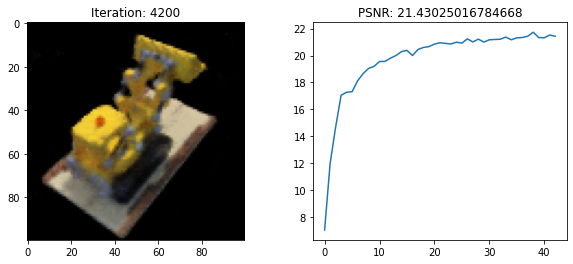

Validation: 0it [00:00, ?it/s]

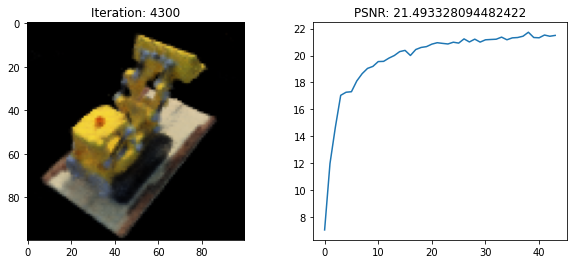

Validation: 0it [00:00, ?it/s]

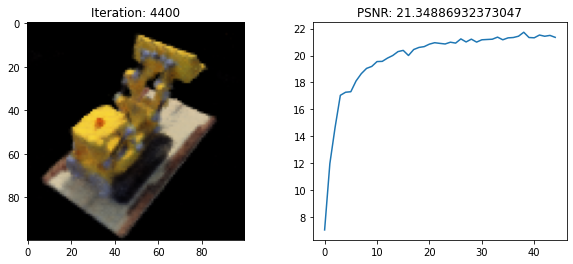

Validation: 0it [00:00, ?it/s]

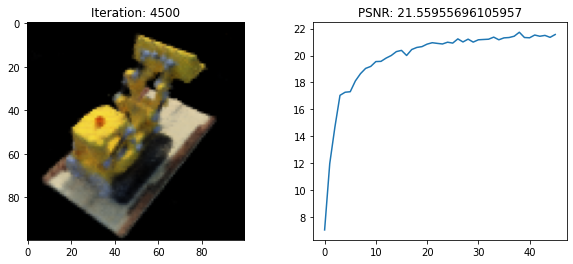

Validation: 0it [00:00, ?it/s]

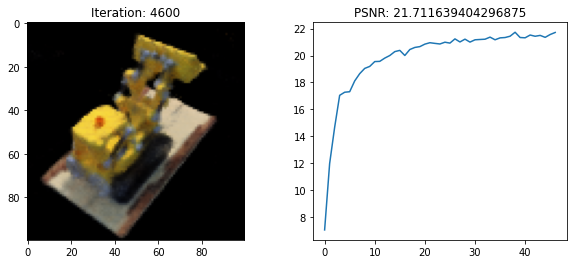

Validation: 0it [00:00, ?it/s]

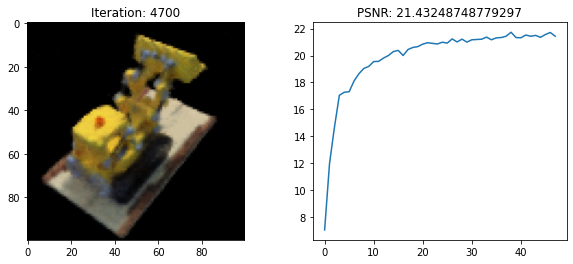

Validation: 0it [00:00, ?it/s]

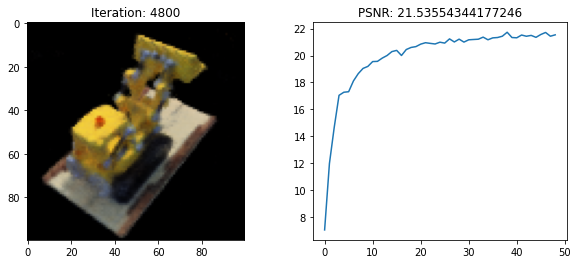

Validation: 0it [00:00, ?it/s]

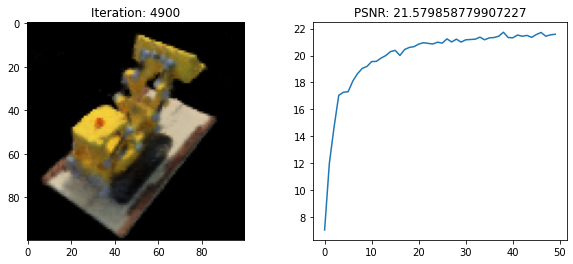

Validation: 0it [00:00, ?it/s]

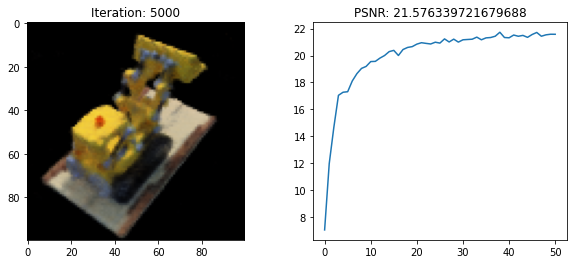

Validation: 0it [00:00, ?it/s]

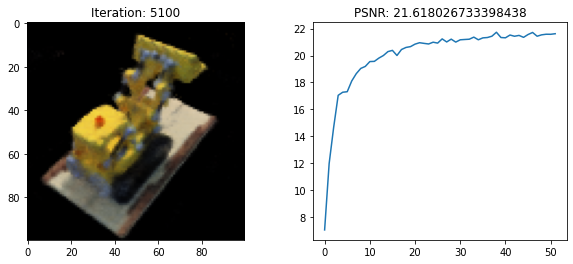

Validation: 0it [00:00, ?it/s]

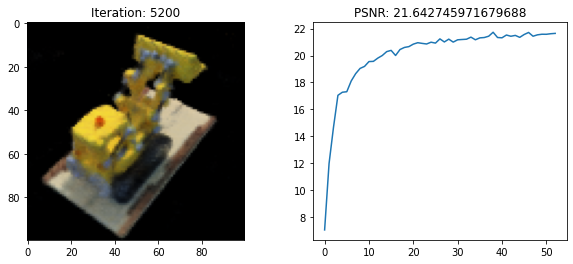

Validation: 0it [00:00, ?it/s]

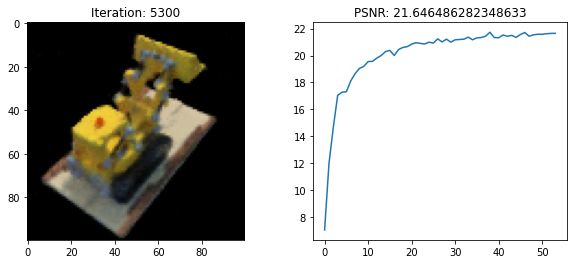

Validation: 0it [00:00, ?it/s]

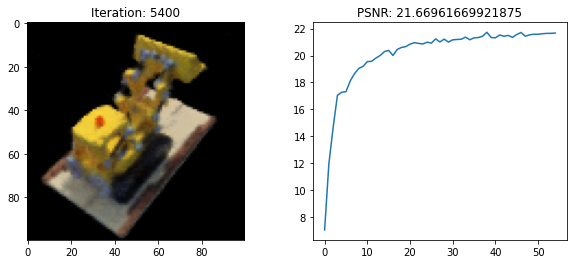

Validation: 0it [00:00, ?it/s]

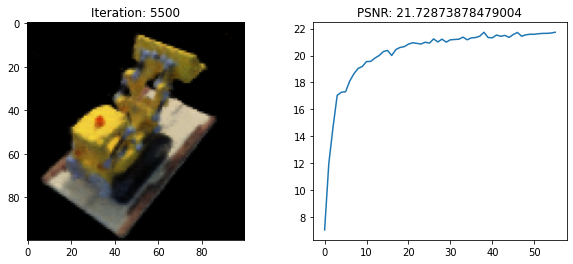

Validation: 0it [00:00, ?it/s]

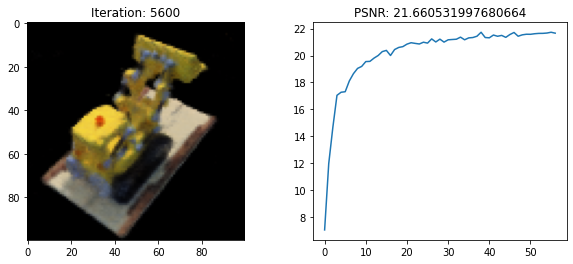

Validation: 0it [00:00, ?it/s]

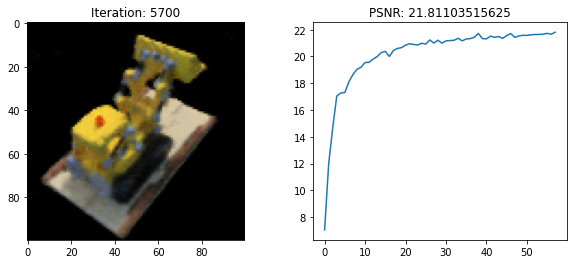

Validation: 0it [00:00, ?it/s]

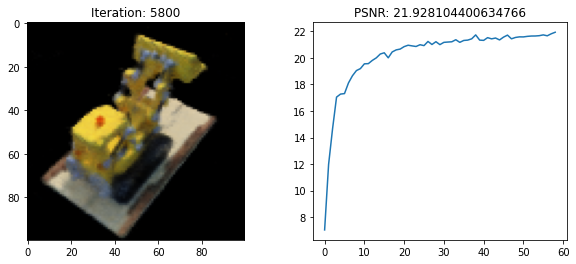

Validation: 0it [00:00, ?it/s]

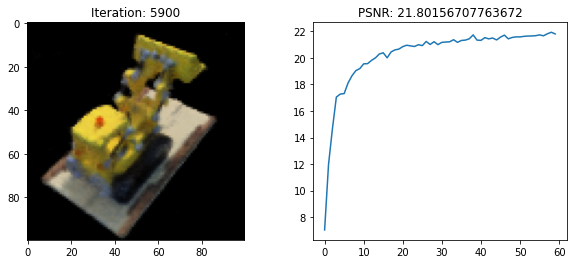

Validation: 0it [00:00, ?it/s]

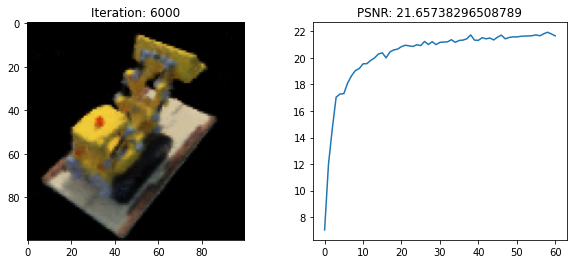

Validation: 0it [00:00, ?it/s]

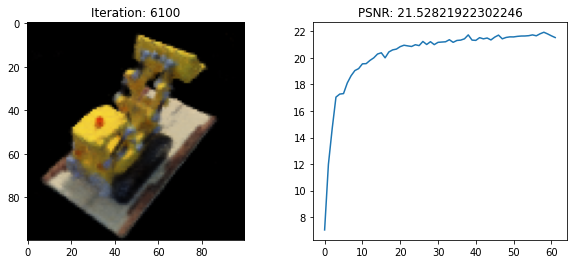

Validation: 0it [00:00, ?it/s]

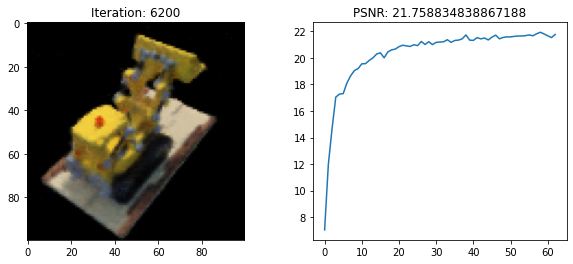

Validation: 0it [00:00, ?it/s]

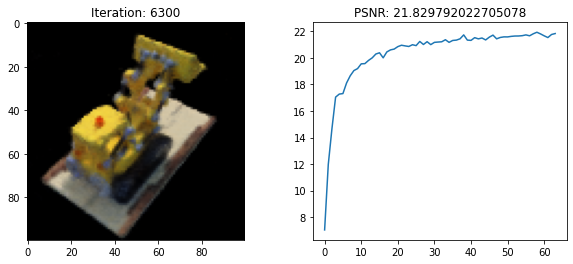

Validation: 0it [00:00, ?it/s]

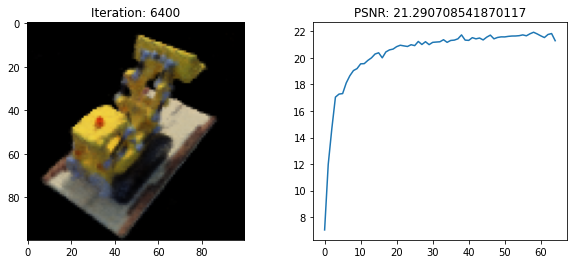

Validation: 0it [00:00, ?it/s]

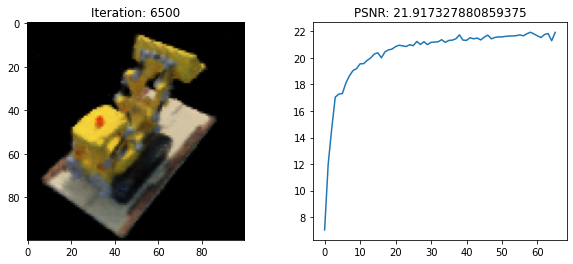

Validation: 0it [00:00, ?it/s]

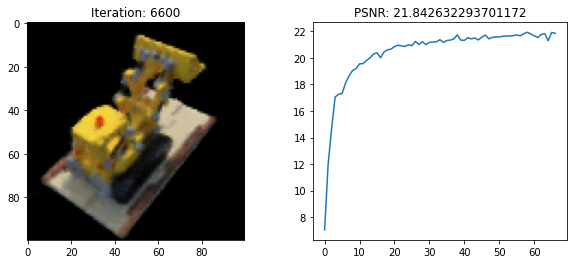

Validation: 0it [00:00, ?it/s]

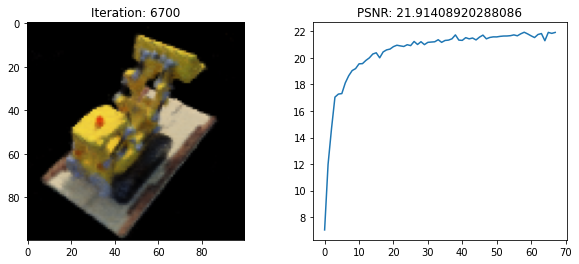

Validation: 0it [00:00, ?it/s]

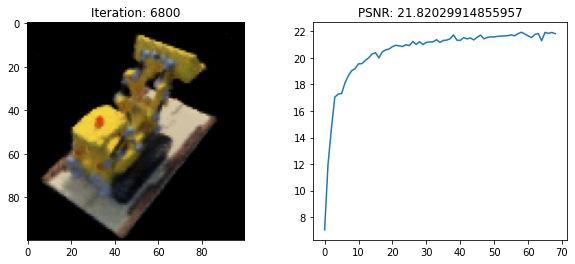

Validation: 0it [00:00, ?it/s]

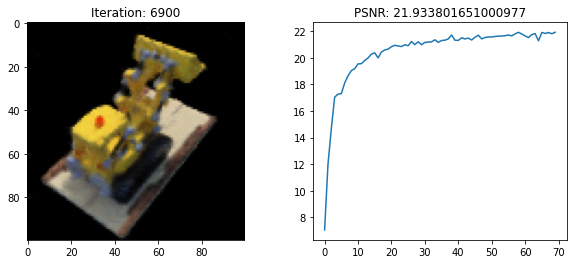

Validation: 0it [00:00, ?it/s]

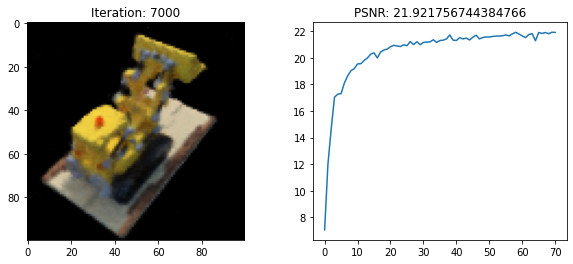

Validation: 0it [00:00, ?it/s]

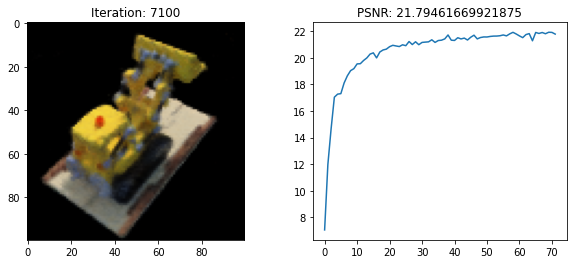

Validation: 0it [00:00, ?it/s]

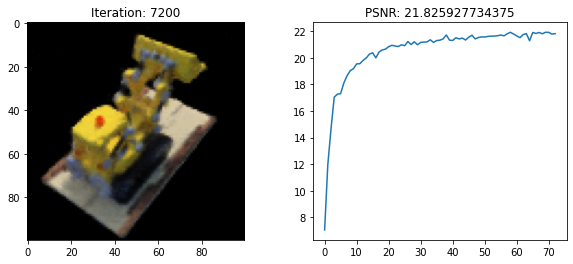

Validation: 0it [00:00, ?it/s]

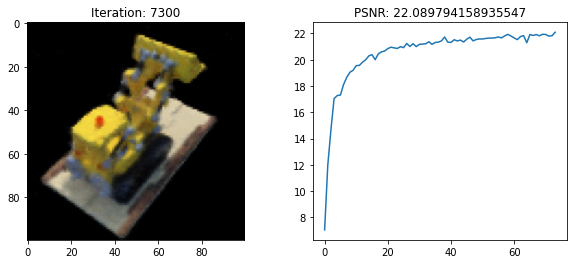

Validation: 0it [00:00, ?it/s]

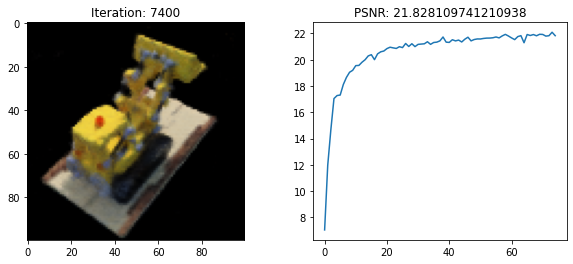

Validation: 0it [00:00, ?it/s]

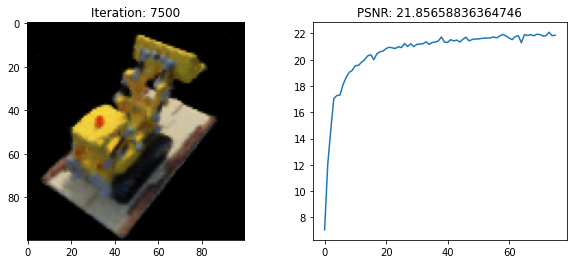

Validation: 0it [00:00, ?it/s]

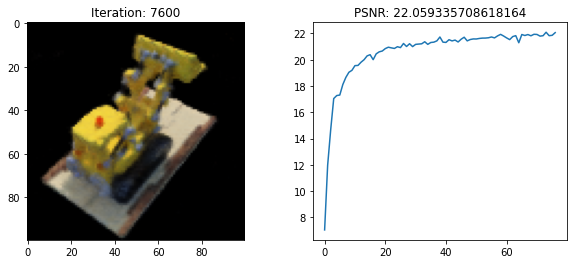

Validation: 0it [00:00, ?it/s]

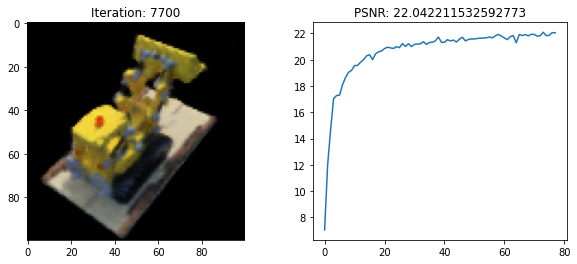

Validation: 0it [00:00, ?it/s]

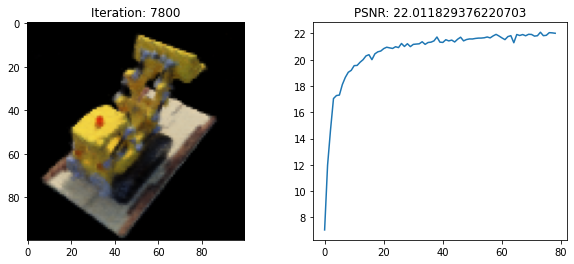

Validation: 0it [00:00, ?it/s]

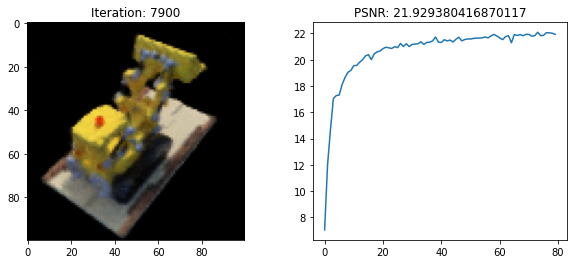

Validation: 0it [00:00, ?it/s]

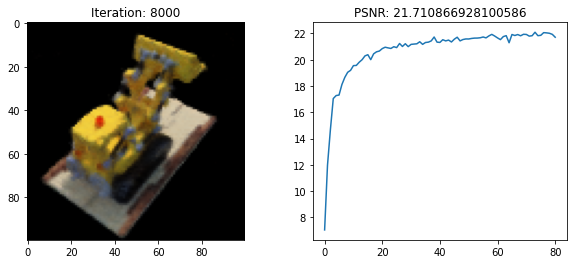

Validation: 0it [00:00, ?it/s]

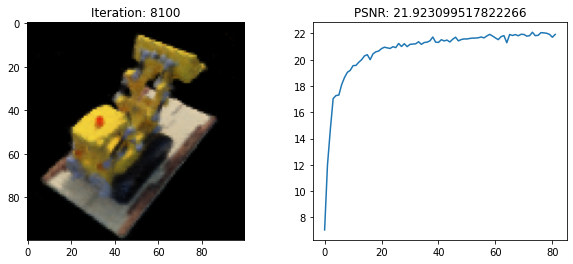

Validation: 0it [00:00, ?it/s]

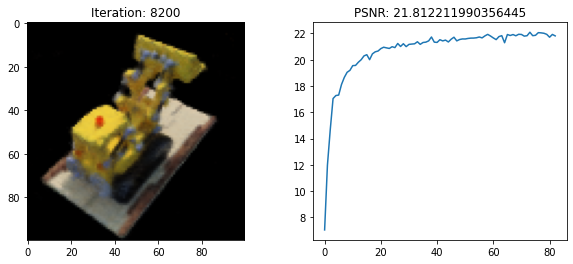

Validation: 0it [00:00, ?it/s]

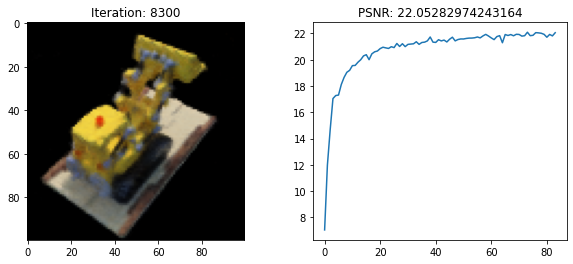

Validation: 0it [00:00, ?it/s]

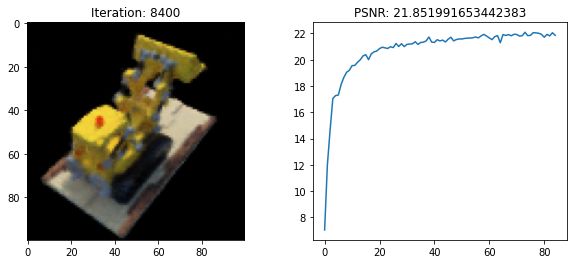

Validation: 0it [00:00, ?it/s]

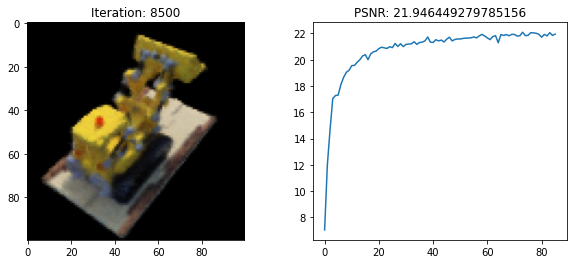

Validation: 0it [00:00, ?it/s]

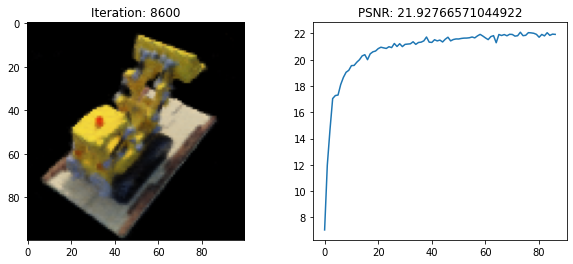

Validation: 0it [00:00, ?it/s]

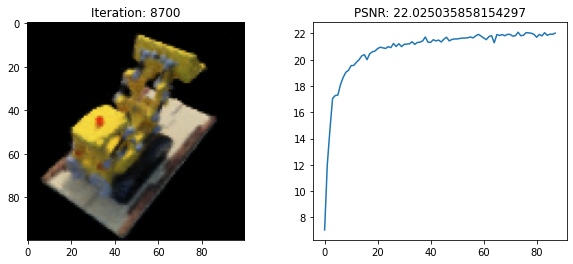

Validation: 0it [00:00, ?it/s]

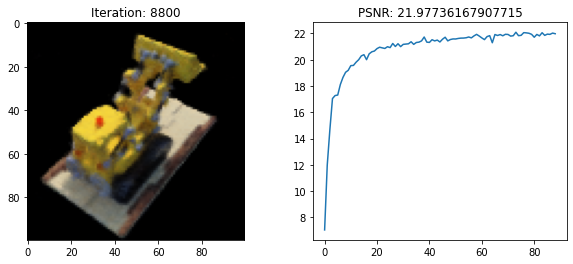

Validation: 0it [00:00, ?it/s]

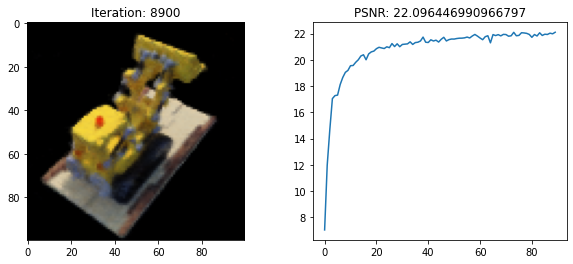

Validation: 0it [00:00, ?it/s]

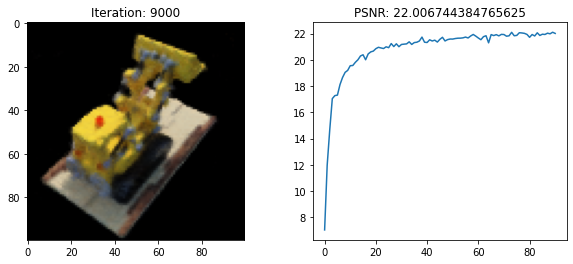

Validation: 0it [00:00, ?it/s]

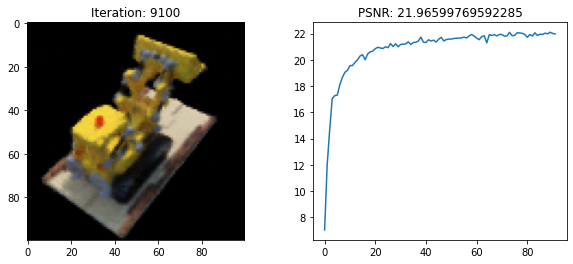

Validation: 0it [00:00, ?it/s]

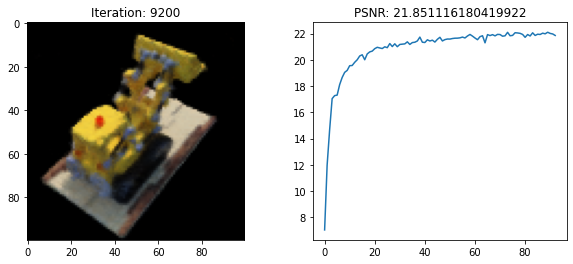

Validation: 0it [00:00, ?it/s]

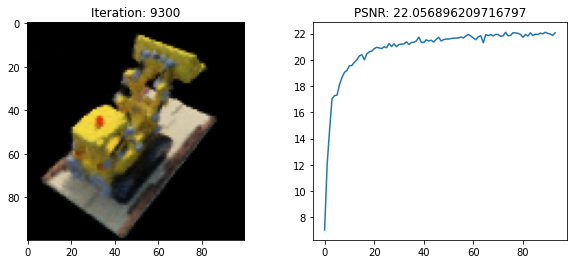

Validation: 0it [00:00, ?it/s]

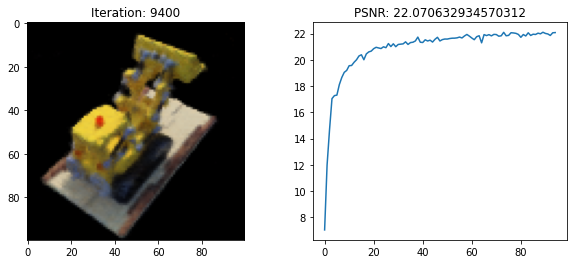

Validation: 0it [00:00, ?it/s]

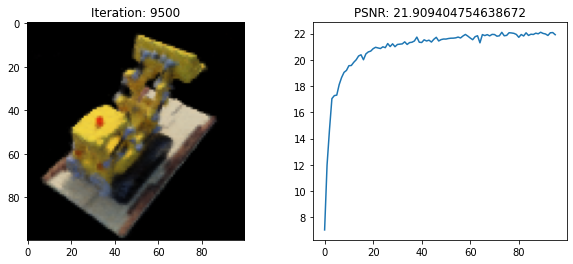

Validation: 0it [00:00, ?it/s]

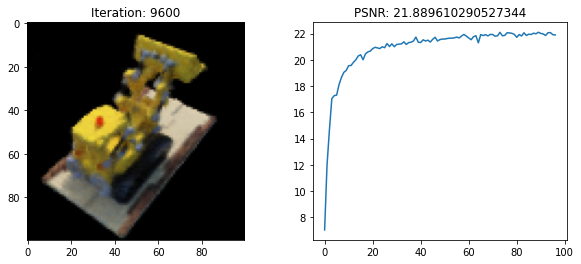

Validation: 0it [00:00, ?it/s]

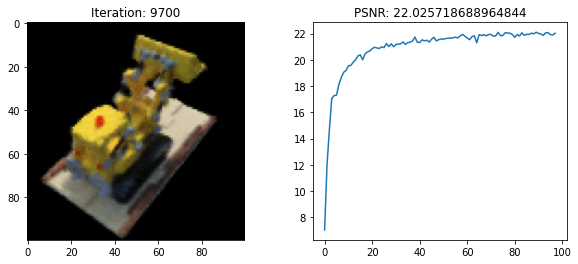

Validation: 0it [00:00, ?it/s]

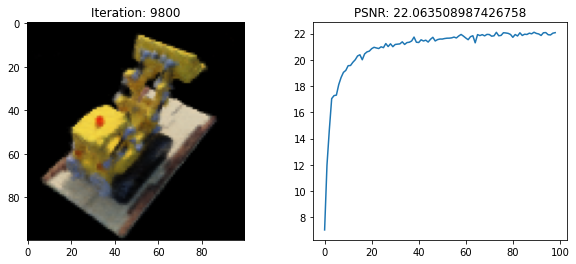

Validation: 0it [00:00, ?it/s]

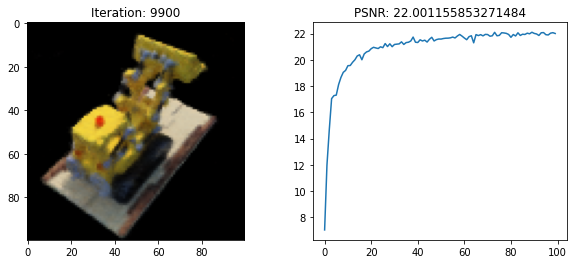

Validation: 0it [00:00, ?it/s]

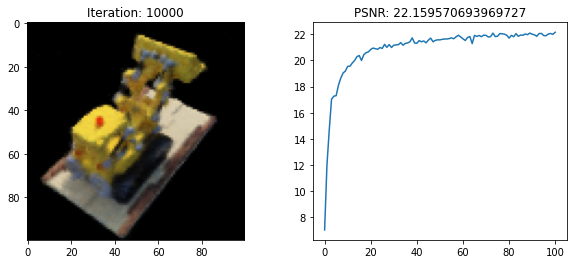

Validation: 0it [00:00, ?it/s]

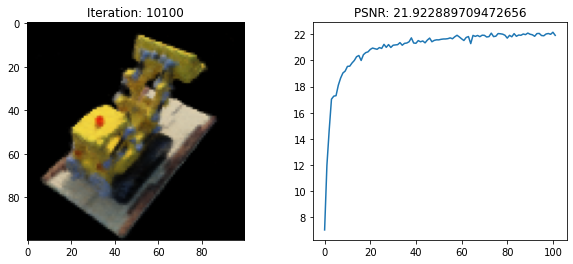

Validation: 0it [00:00, ?it/s]

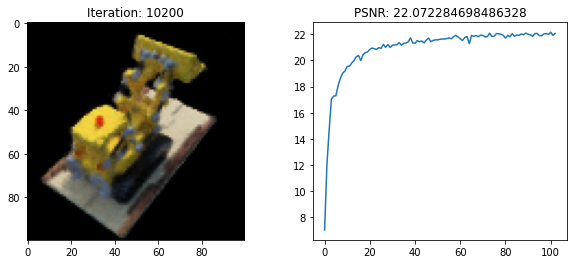

Validation: 0it [00:00, ?it/s]

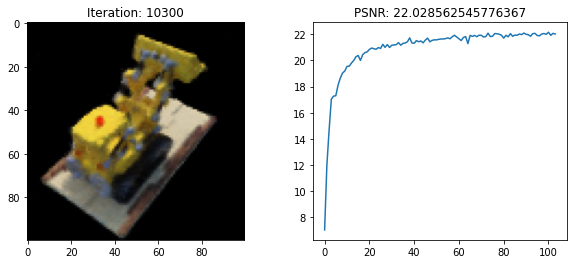

Validation: 0it [00:00, ?it/s]

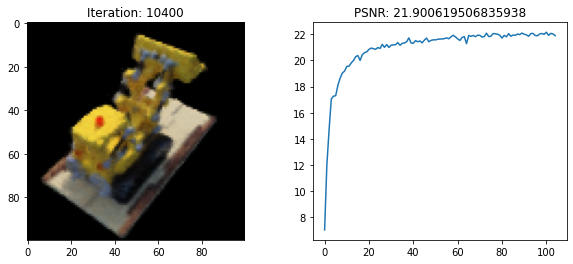

Validation: 0it [00:00, ?it/s]

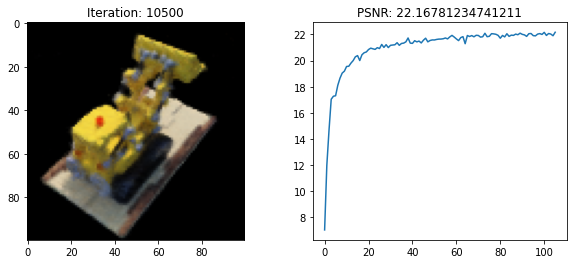

Validation: 0it [00:00, ?it/s]

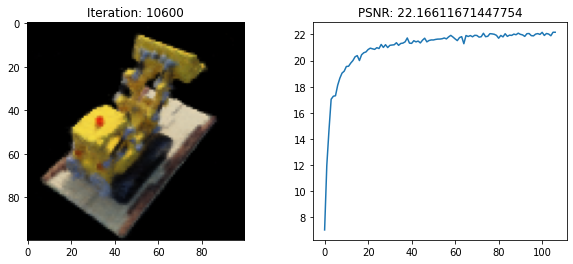

Validation: 0it [00:00, ?it/s]

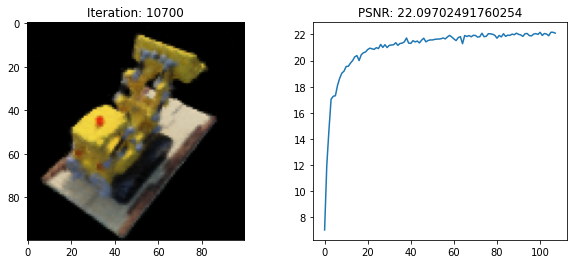

Validation: 0it [00:00, ?it/s]

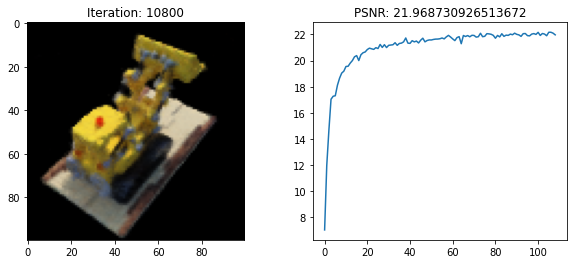

Validation: 0it [00:00, ?it/s]

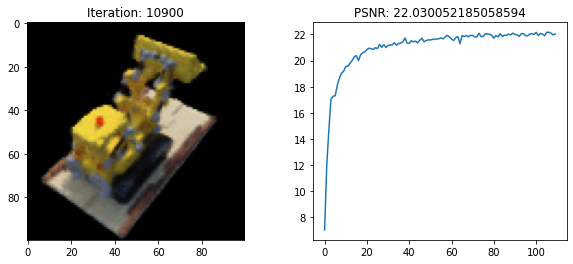

Validation: 0it [00:00, ?it/s]

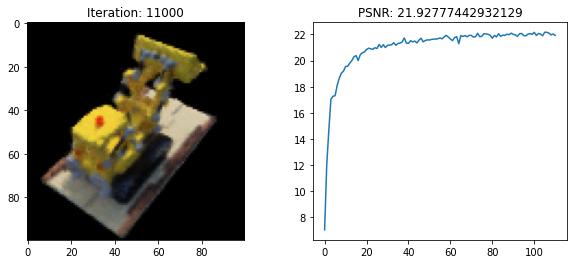

Validation: 0it [00:00, ?it/s]

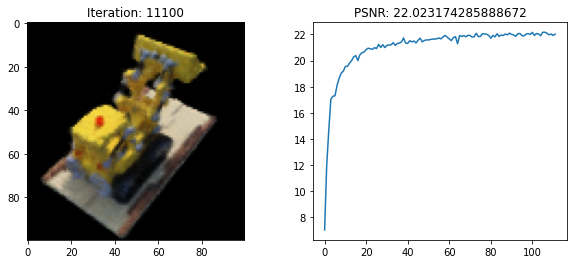

Validation: 0it [00:00, ?it/s]

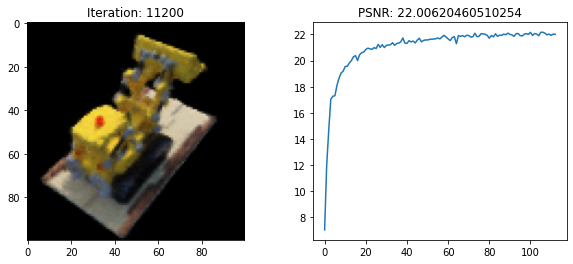

Validation: 0it [00:00, ?it/s]

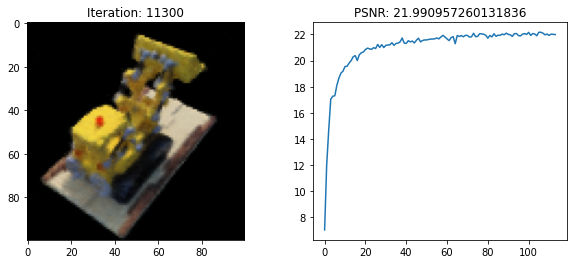

Validation: 0it [00:00, ?it/s]

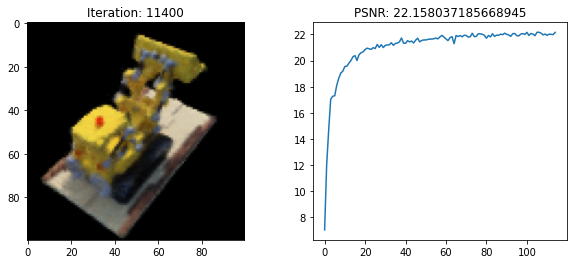

Validation: 0it [00:00, ?it/s]

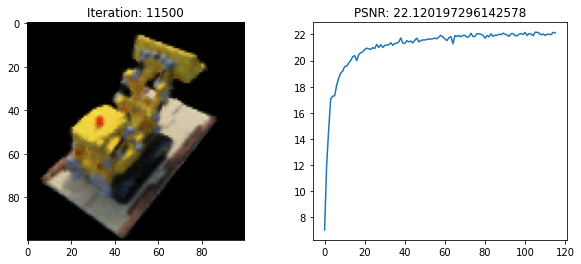

Validation: 0it [00:00, ?it/s]

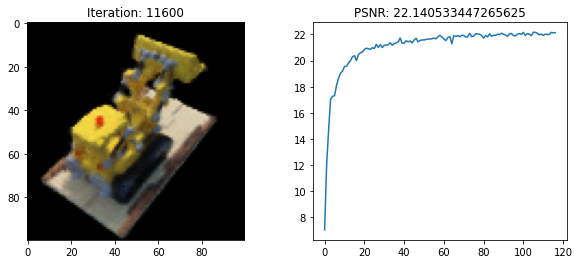

Validation: 0it [00:00, ?it/s]

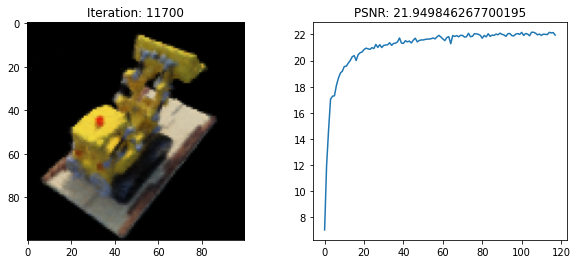

Validation: 0it [00:00, ?it/s]

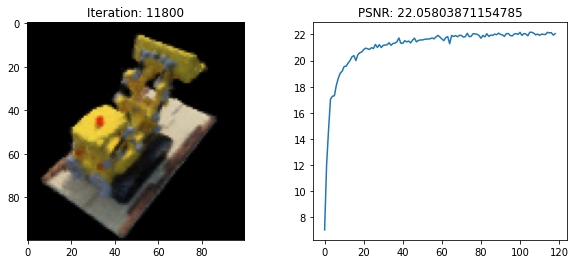

Validation: 0it [00:00, ?it/s]

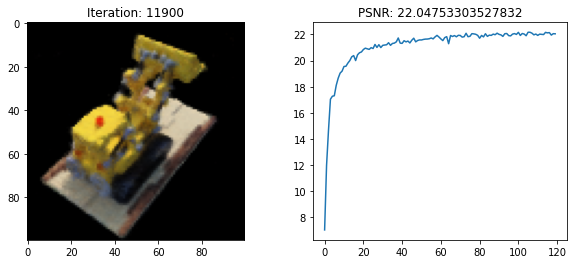

Validation: 0it [00:00, ?it/s]

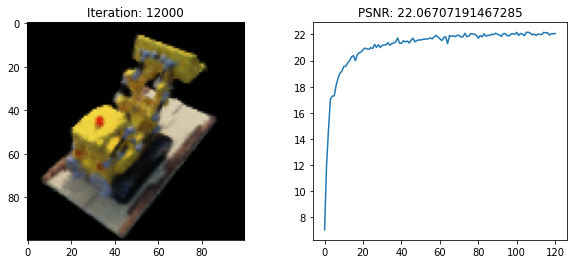

Validation: 0it [00:00, ?it/s]

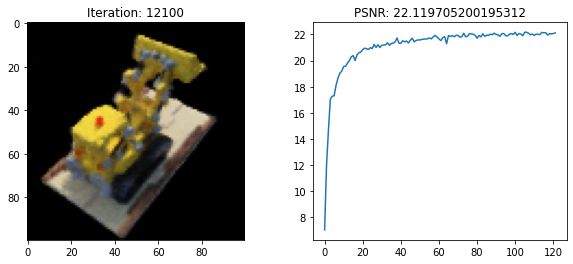

Validation: 0it [00:00, ?it/s]

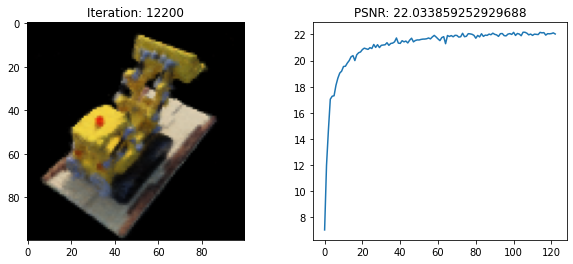

Validation: 0it [00:00, ?it/s]

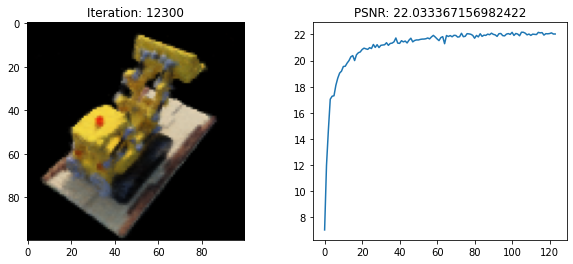

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/call.py:48: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [ ]:
# MODEL TRAINING

# LOAD_CHECKPOINT HERE
# ckpt_path = os.path.join(gdrive_path, 'model/lego/300k.ckpt')
ckpt_path = None

torch.cuda.empty_cache()

tb_logger = pl_loggers.TensorBoardLogger(os.path.join(gdrive_path, "log/"))

model.train()

# epochs needed to do 100k iterations
iter_per_epoch = len(trainDataset)//batch_size
epochs = int(1e5//iter_per_epoch)

print("Epochs: {0}".format(epochs))

trainer = pl.Trainer(gpus=1 if use_cuda else 0,
                     max_epochs=epochs,
                     logger=tb_logger,
                     log_every_n_steps=iter_per_epoch-1,
                     check_val_every_n_epoch=None,
                     val_check_interval=100,
                     precision=16)
trainer.fit(model, train_loader, val_loader, ckpt_path=ckpt_path)
torch.save(model.state_dict(), 'model.pth')

In [ ]:
!tensorboard --logdir=log

^C


In [ ]:
# LOAD TRAINED MODEL FOR EVALUATION
model = NERF(
    hierarchical_sampling=False,
    rays_per_chunk=1024*2).cuda().eval()
ckpt_path = os.path.join(gdrive_path, 'model/lego/batch1_400.ckpt')
checkpoint = torch.load(ckpt_path)
model.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [ ]:
# INTERACTIVE VISUALIZER
!pip install ipywidgets

from ipywidgets import interact, interactive, widgets

img, pose, focal = trainDataset[0]

# Adopted from tiny-nerf
trans_t = lambda t : torch.tensor([
    [1,0,0,0],
    [0,1,0,0],
    [0,0,1,t],
    [0,0,0,1],
], dtype=torch.float)

rot_phi = lambda phi : torch.tensor([
    [1,0,0,0],
    [0,torch.cos(phi),-torch.sin(phi),0],
    [0,torch.sin(phi), torch.cos(phi),0],
    [0,0,0,1],
], dtype=torch.float)

rot_theta = lambda th : torch.tensor([
    [torch.cos(th),0,-torch.sin(th),0],
    [0,1,0,0],
    [torch.sin(th),0, torch.cos(th),0],
    [0,0,0,1],
], dtype=torch.float)

def get_c2w(theta, phi, radius):
    p = torch.tensor([phi*torch.pi/180.0])
    t = torch.tensor([theta*torch.pi/180.0])
    c2w = torch.matmul(torch.Tensor([[-1,0,0,0],[0,0,1,0],[0,1,0,0],[0,0,0,1]]),
                       torch.matmul(rot_theta(t),
                                    torch.matmul(rot_phi(p),
                                                 trans_t(radius))))
    return c2w

def visualize(theta=100, phi=-30, r=4.0):
  c2w = get_c2w(theta, phi, r)
  rays_o, rays_d = model.generate_rays(img.to(model.device).unsqueeze(0), 
                                       c2w.to(model.device).unsqueeze(0), 
                                       torch.Tensor(focal))
  coarse, fine = model(rays_o, rays_d)
  rgb = fine[0] if fine else coarse[0]
  rgb = rgb[0]

  plt.imshow(rgb.cpu().detach().numpy())
  plt.title("theta: {0}, phi: {1}, r: {2}".format(theta, phi, r))
  plt.show()

# interact(visualize, theta=(0,360), phi=(-90,0), r=(3.0,5.0))


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 25.1 MB/s 


In [ ]:
from tqdm import tqdm_notebook as tqdm
!pip install imageio-ffmpeg

frames = []
for th in tqdm(np.linspace(0., 360., 120, endpoint=False)):
    c2w = get_c2w(th, -30., 4.)
    rays_o, rays_d = model.generate_rays(img.to(model.device).unsqueeze(0), 
                                        c2w.to(model.device).unsqueeze(0), 
                                        torch.Tensor(focal))
    coarse, fine = model(rays_o, rays_d)
    rgb = fine[0] if fine else coarse[0]
    rgb = rgb[0]

    frames.append((255*np.clip(rgb.cpu().detach().numpy(),0,1)).astype(np.uint8))

    del rgb, coarse, fine, rays_o, rays_d
    torch.cuda.empty_cache()

import imageio
f = 'video.mp4'
imageio.mimwrite(f, frames, fps=30, quality=7)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 2.0 MB/s 


<ipython-input-9-b3d0ed2efcb9>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for th in tqdm(np.linspace(0., 360., 120, endpoint=False)):


  0%|          | 0/120 [00:00<?, ?it/s]

OutOfMemoryError: ignored

In [ ]:
del rgb, coarse, fine, rays_o, rays_d
torch.cuda.empty_cache()

NameError: ignored